AI for Medical Sciences and Psychology by Tshepo Chris Nokeri, Apress. 2022

# Chapter 5 Modelling Magnetic Resonance Imaging and X-Rays by Carrying out Artificial Neural Networks

This chapter intimately acquaints you with the practical application of computer vision and artificial neural networks in neurology and radiology. It promptly carrying out convolutional neural networks for image classification. The initial network models MRI scans to set apart patients with and without a brain tumor, and the second network models X-ray scans to set apart patients with and without pneumonia. Besides that, it unveils an effective technique for appraising networks in medical image classification.

In [53]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set("talk","ticks", font_scale = 1, font = "Calibri")
from pylab import rcParams
plt.rcParams["figure.dpi"] = 300
import tensorflow as tf
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from tensorflow.keras.metrics import categorical_crossentropy
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D,GlobalAveragePooling2D
from keras.layers import Activation, Dropout, BatchNormalization, Flatten, Dense, AvgPool2D,MaxPool2D
from keras.models import Sequential, Model
from keras.optimizers import Adam, SGD, RMSprop
from keras import backend as K

import cv2
import shutil
import glob
import os
brain_tumor_data = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\brain_mri_data\brain_tumor_dataset"
brain_tumor_categories = ["yes"]
for x in brain_tumor_categories:
    directory = os.path.join(brain_tumor_data, x)
    for brain_tumor_image in os.listdir(directory):
        brain_tumor_images = cv2.imread(os.path.join(directory, brain_tumor_image))   

# Previewing Individual Brain Tumor Scans

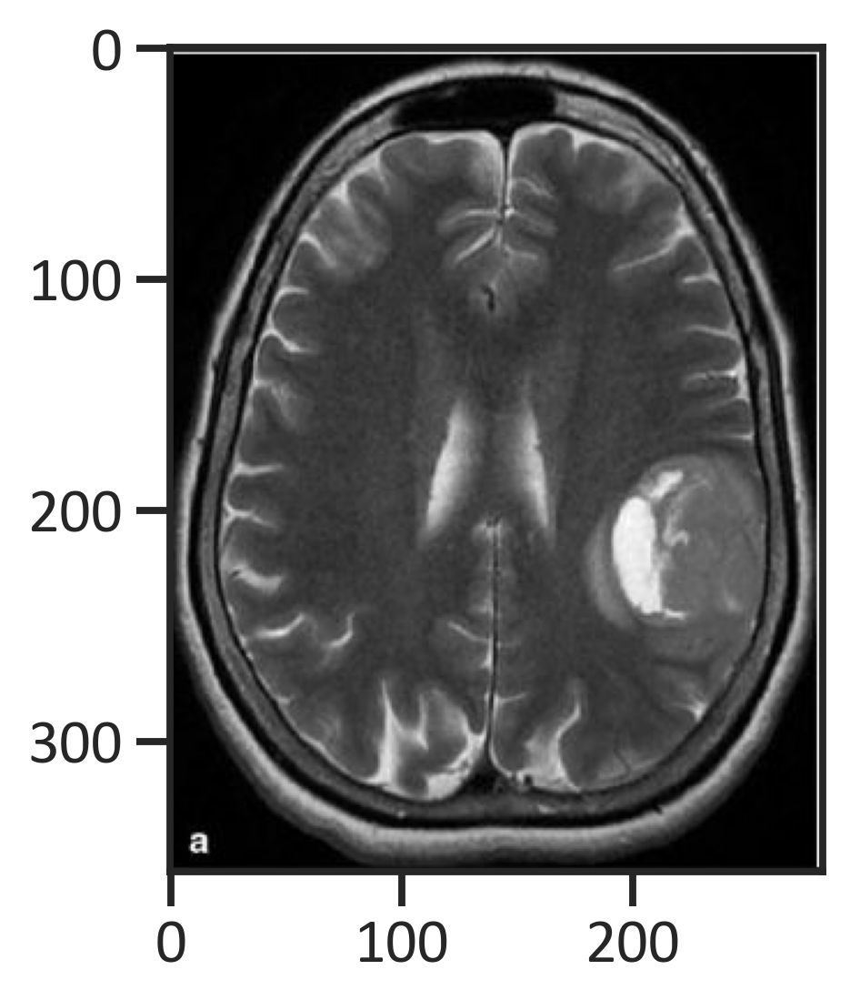

In [33]:
brain_tumor_data = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\brain_mri_data\brain_tumor_dataset"
brain_tumor_categories = ["yes"]
for x in brain_tumor_categories:
    directory = os.path.join(brain_tumor_data, x)
    for brain_tumor_image in os.listdir(directory):
        brain_tumor_images = cv2.imread(os.path.join(directory, brain_tumor_image))   
plt.imshow(brain_tumor_images)
plt.show()

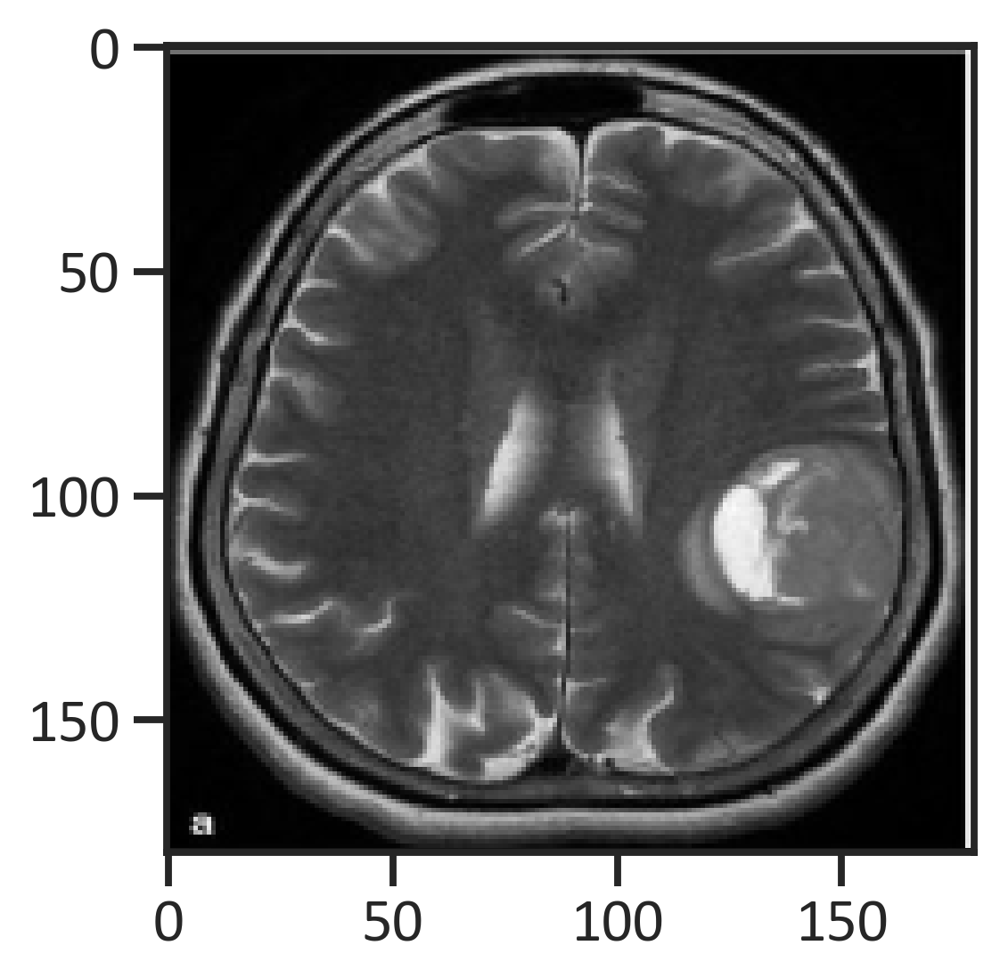

In [34]:
brain_tumor_resized_image = cv2.resize(brain_tumor_images, (180, 180))    
plt.imshow(brain_tumor_resized_image)
plt.show()

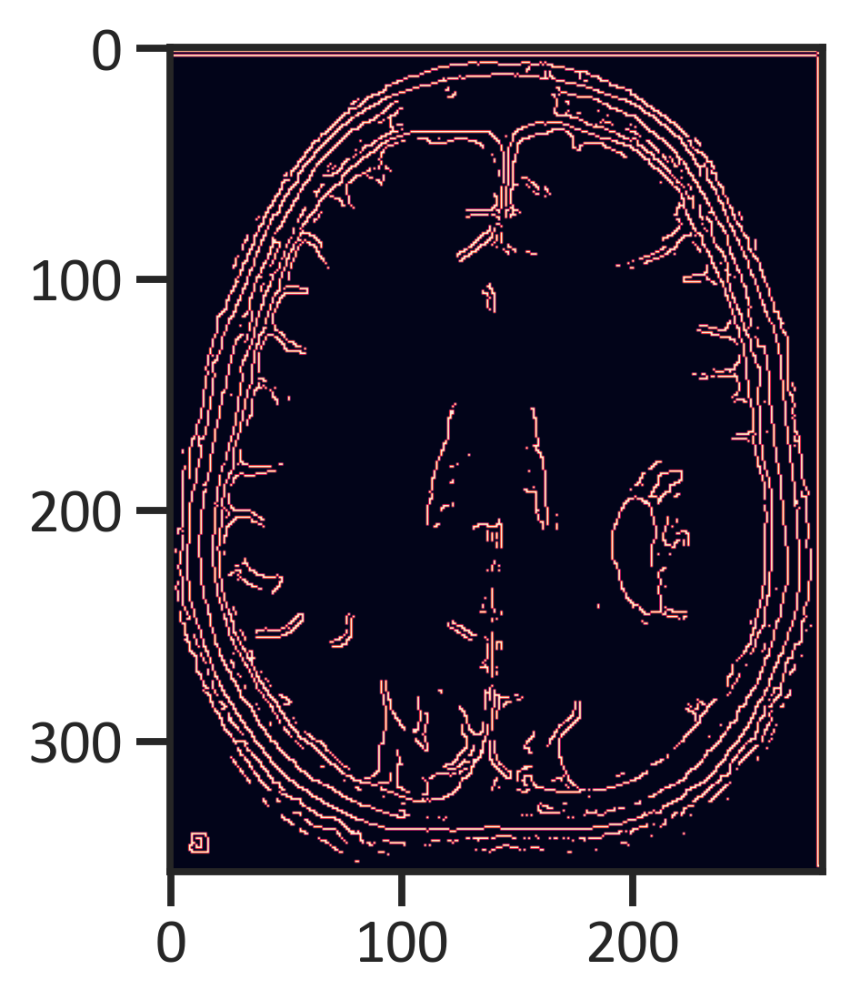

In [35]:
canny_brain_tumor_images = cv2.Canny(brain_tumor_images, 180, 180)
plt.imshow(canny_brain_tumor_images)
plt.show()

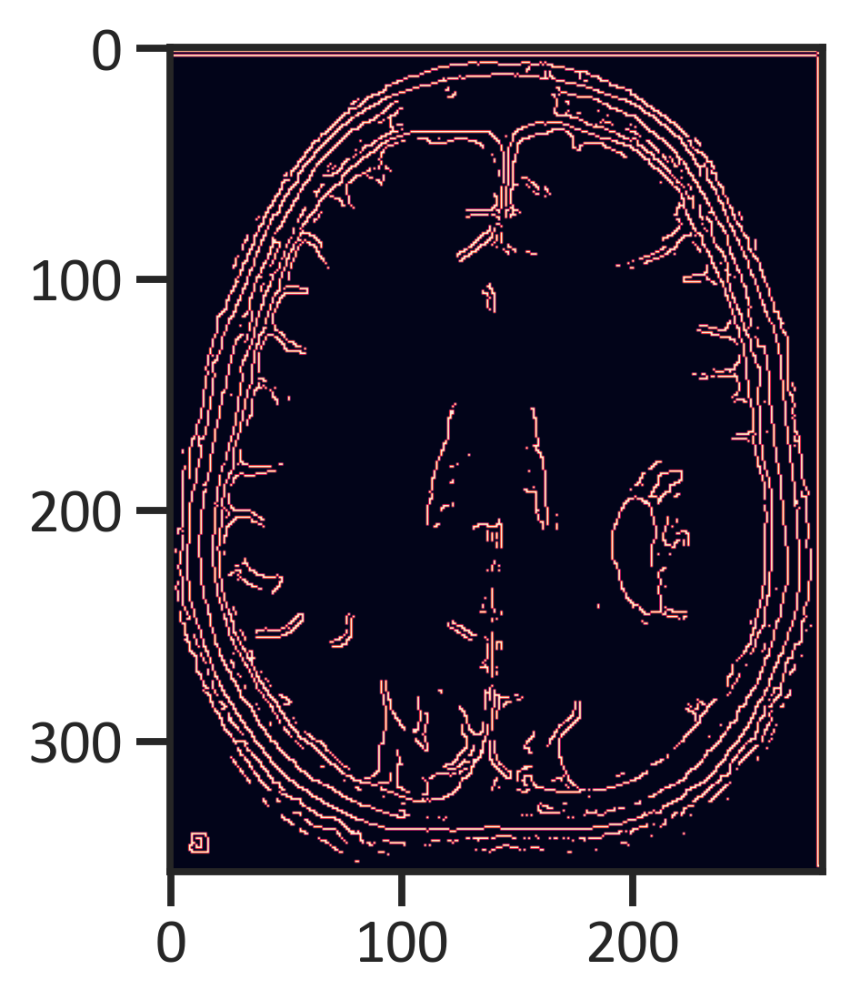

In [36]:
laplacian_brain_tumor_images = cv2.Laplacian(brain_tumor_images, cv2.CV_64F)
plt.imshow(canny_brain_tumor_images)
plt.show()

# Previewing Brain Scans with No Tumor

In [37]:
no_brain_tumor_data = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\brain_mri_data\brain_tumor_dataset"
no_brain_tumor_categories = ["no"]
for x in no_brain_tumor_categories:
    directory = os.path.join(no_brain_tumor_data, x)
    for no_brain_tumor_image in os.listdir(directory):
        no_brain_tumor_images = cv2.imread(os.path.join(directory, no_brain_tumor_image))   

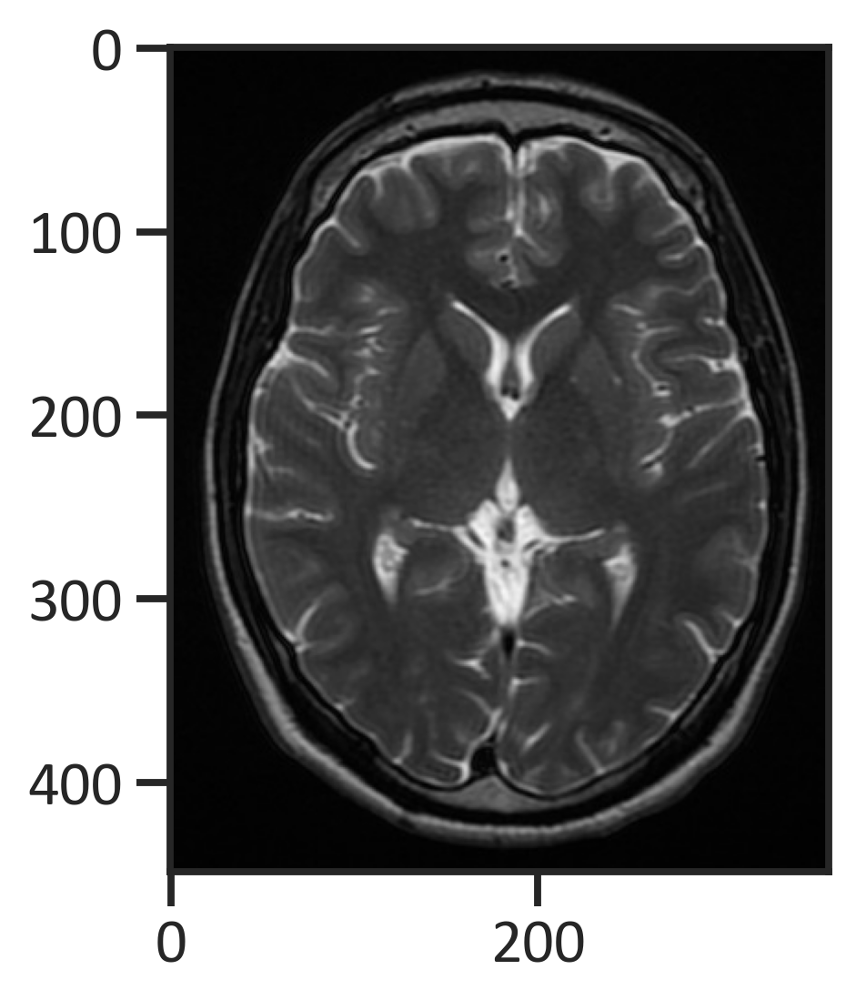

In [38]:
plt.imshow(no_brain_tumor_images)
plt.show()

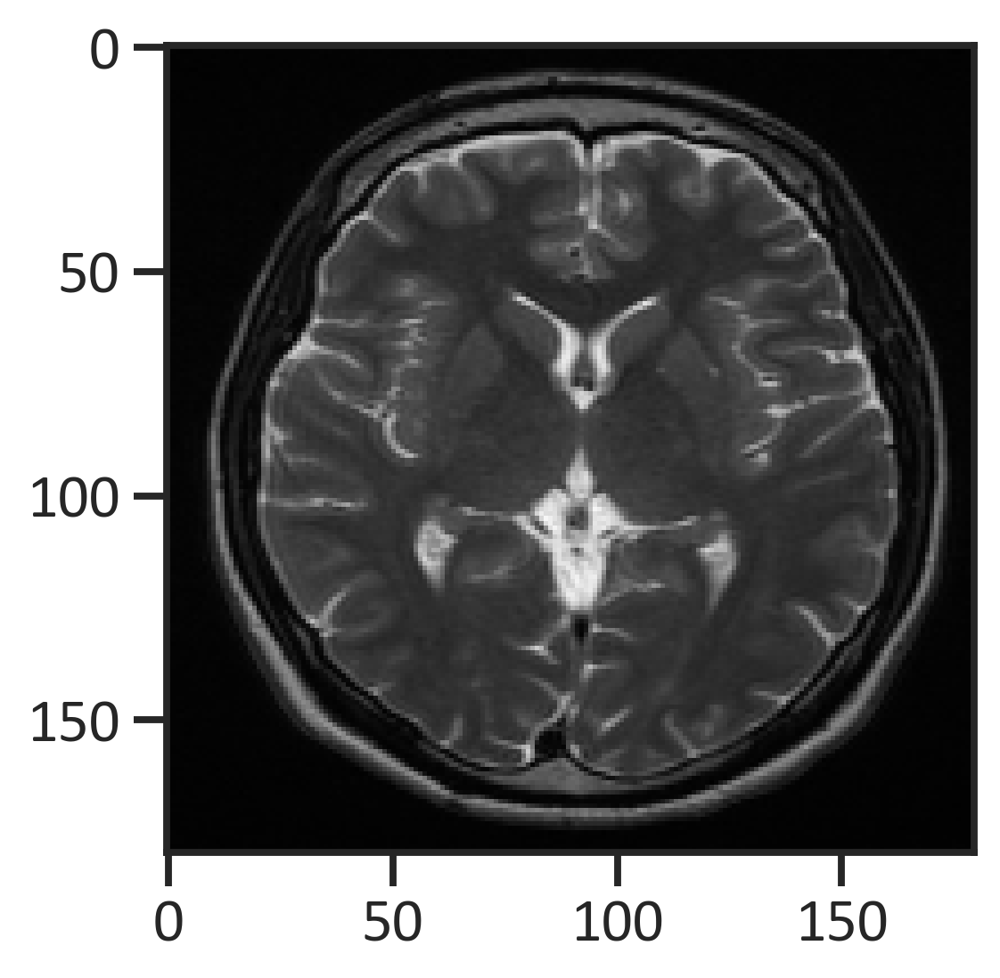

In [39]:
no_brain_tumor_resized_image = cv2.resize(no_brain_tumor_images, (180, 180))    
plt.imshow(no_brain_tumor_resized_image)
plt.show()

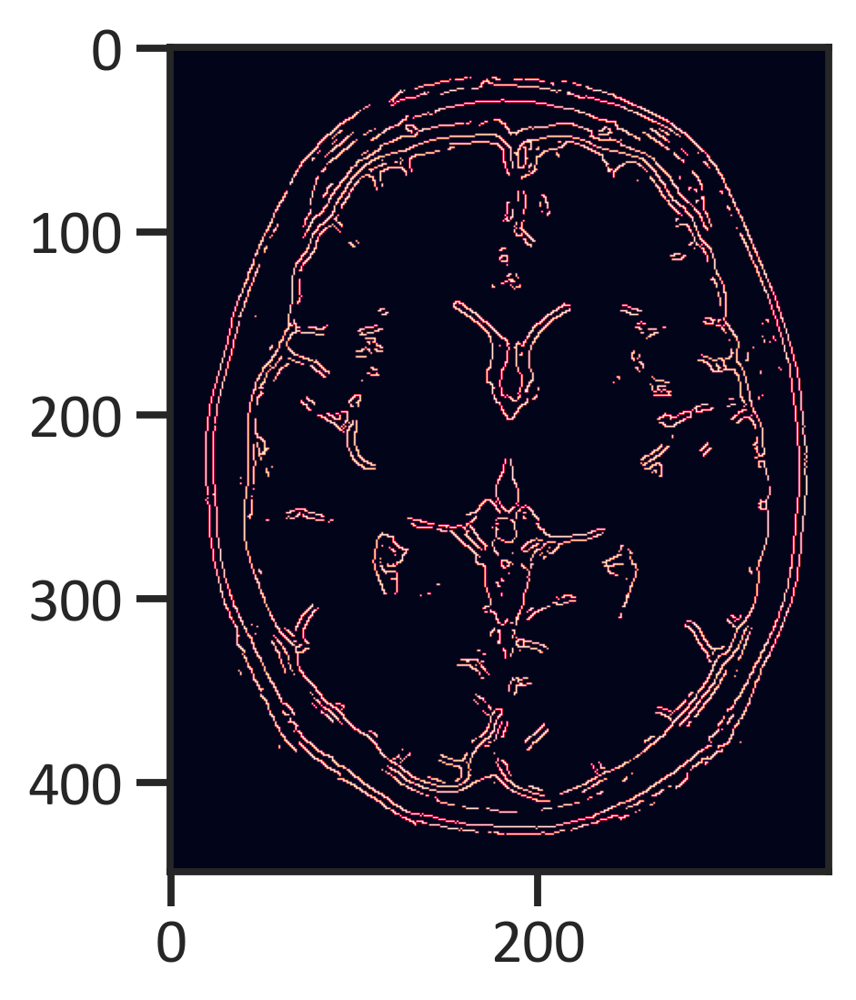

In [40]:
canny_no_brain_tumor_images = cv2.Canny(no_brain_tumor_images, 180, 180)
plt.imshow(canny_no_brain_tumor_images)
plt.show()

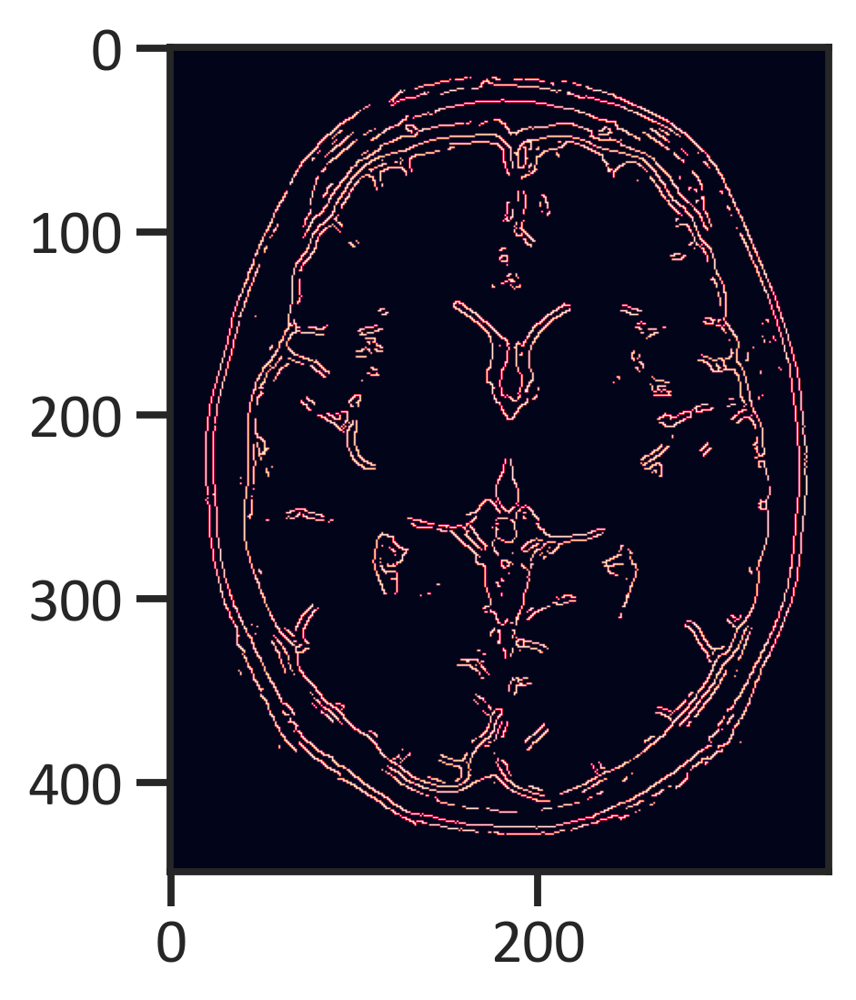

In [41]:
laplacian_no_brain_tumor_images = cv2.Laplacian(no_brain_tumor_images, cv2.CV_64F)
plt.imshow(canny_no_brain_tumor_images)
plt.show()

# Generating the Training MRI Image Data 

Found 253 files belonging to 2 classes.
Using 203 files for training.
Found 253 files belonging to 2 classes.
Using 50 files for validation.
Found 253 images belonging to 2 classes.


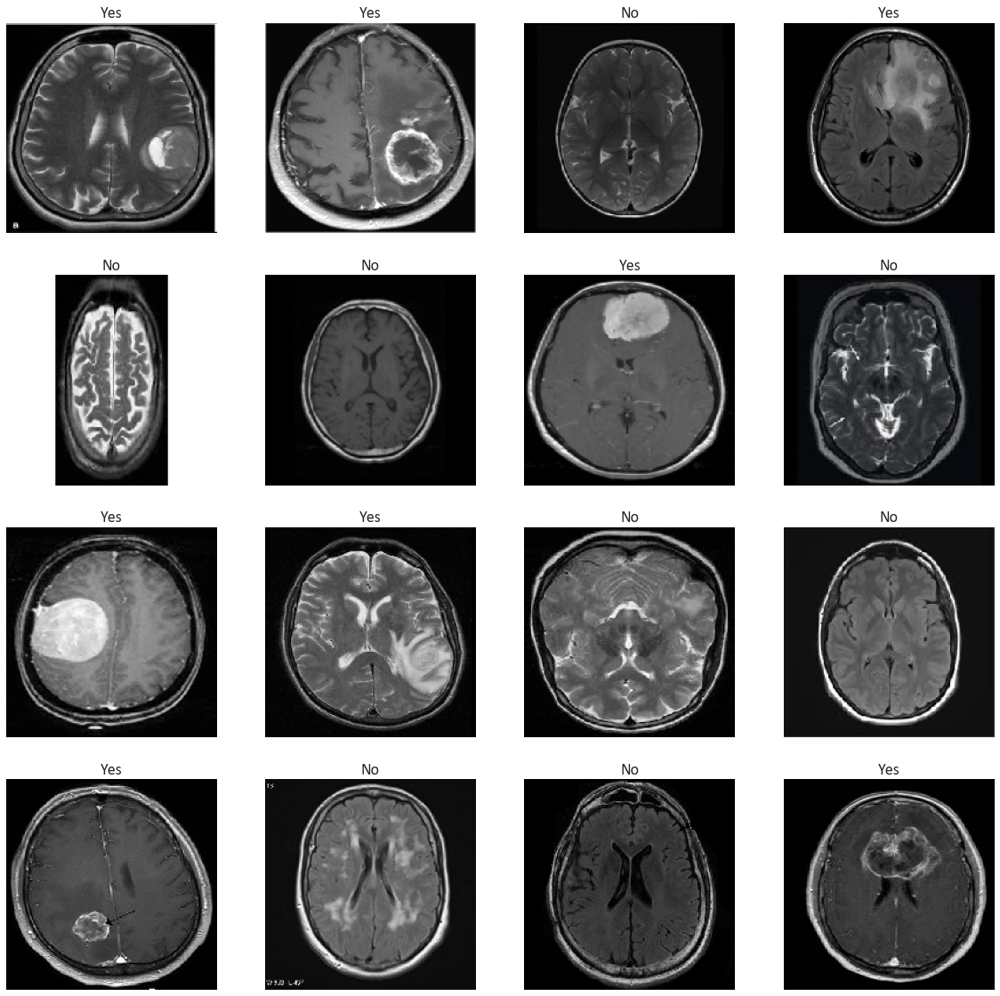

In [54]:
import keras
import numpy as np
brain_tumor_training_data = image_dataset_from_directory(brain_tumor_data, seed = 123, validation_split = 0.2, subset = "training", image_size = (180, 180), batch_size = 16)
brain_tumor_validation_data = image_dataset_from_directory(brain_tumor_data, seed = 123, validation_split = 0.2, subset = "validation", image_size = (180, 180), batch_size = 16)
brain_tumor_training_data_categories = np.array(brain_tumor_training_data.class_names)
brain_tumor_generated_image_data = ImageDataGenerator(rescale = 1./255)
brain_tumor_generated_image_data_for_training = brain_tumor_generated_image_data.flow_from_directory(brain_tumor_data, target_size = (180, 180), class_mode = "categorical",  shuffle = True, batch_size = 16)
brain_tumor_images, brain_tumor_labels = next(iter(brain_tumor_generated_image_data_for_training))
def brain_tumor_images_function(brain_tumor_images, brain_tumor_labels):
    plt.figure(figsize = (20, 20))
    for n in range(16):
        ax = plt.subplot(4, 4, n+1)
        plt.imshow(brain_tumor_images[n])
        plt.title(brain_tumor_training_data_categories[brain_tumor_labels[n]==1][0].title())
        plt.axis("off")
brain_tumor_images_function(brain_tumor_images, brain_tumor_labels)

# Tuning the Training MRI Image Data

In [5]:
brain_tumor_experimental_tuning = tf.data.experimental.AUTOTUNE
brain_tumor_training_data = brain_tumor_training_data.cache().shuffle(1000).prefetch(buffer_size = brain_tumor_experimental_tuning)
brain_tumor_validation_data = brain_tumor_validation_data.cache().prefetch(buffer_size = brain_tumor_experimental_tuning)

# Executing the Convolutional Neural Network to Classify Patients’ MRI Image Data

In [6]:
from tensorflow.keras import layers
from tensorflow.python.keras.layers import Dense, Flatten, Conv2D, Dropout, MaxPooling2D
brain_tumor_convolutional_net_model = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Conv2D(16, 3, activation = "relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, activation="relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(128, 3, activation="relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(255, activation="relu"),
  tf.keras.layers.Dense(3)
])

In [7]:
brain_tumor_convolutional_net_model.compile(optimizer = "adam", loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True), metrics = ["accuracy"])
brain_tumor_convolutional_net_model_history = brain_tumor_convolutional_net_model.fit(brain_tumor_training_data, validation_data = brain_tumor_validation_data, epochs = 64)

Epoch 1/64
13/13 [==============================] - 8s 603ms/step - loss: 0.8125 - accuracy: 0.6453 - val_loss: 0.5953 - val_accuracy: 0.8000
Epoch 2/64
13/13 [==============================] - 7s 567ms/step - loss: 0.5085 - accuracy: 0.7734 - val_loss: 0.5267 - val_accuracy: 0.8000
Epoch 3/64
13/13 [==============================] - 7s 562ms/step - loss: 0.4110 - accuracy: 0.8177 - val_loss: 0.5610 - val_accuracy: 0.8000
Epoch 4/64
13/13 [==============================] - 8s 591ms/step - loss: 0.3418 - accuracy: 0.8719 - val_loss: 0.6464 - val_accuracy: 0.8000
Epoch 5/64
13/13 [==============================] - 7s 560ms/step - loss: 0.3021 - accuracy: 0.8670 - val_loss: 0.5463 - val_accuracy: 0.8400
Epoch 6/64
13/13 [==============================] - 7s 575ms/step - loss: 0.1913 - accuracy: 0.9015 - val_loss: 0.4834 - val_accuracy: 0.8600
Epoch 7/64
13/13 [==============================] - 7s 559ms/step - loss: 0.1433 - accuracy: 0.9409 - val_loss: 0.4495 - val_accuracy: 0.8800
Epoch 

# Considering the Convolutional Neural Network’s Performance

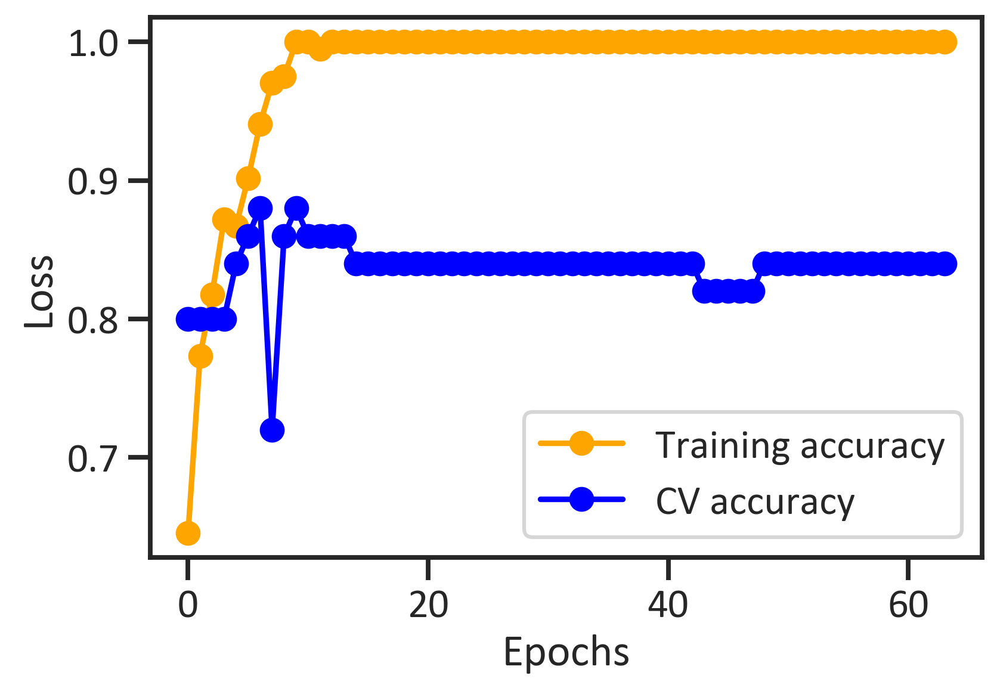

In [8]:
plt.plot(brain_tumor_convolutional_net_model_history.history["accuracy"],
         color = "orange",
         marker = "o",
         label = "Training accuracy")
plt.plot(brain_tumor_convolutional_net_model_history.history["val_accuracy"],
         color = "blue",
         marker = "o",
         label = "CV accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy
plt.legend(loc = "best")
plt.show()

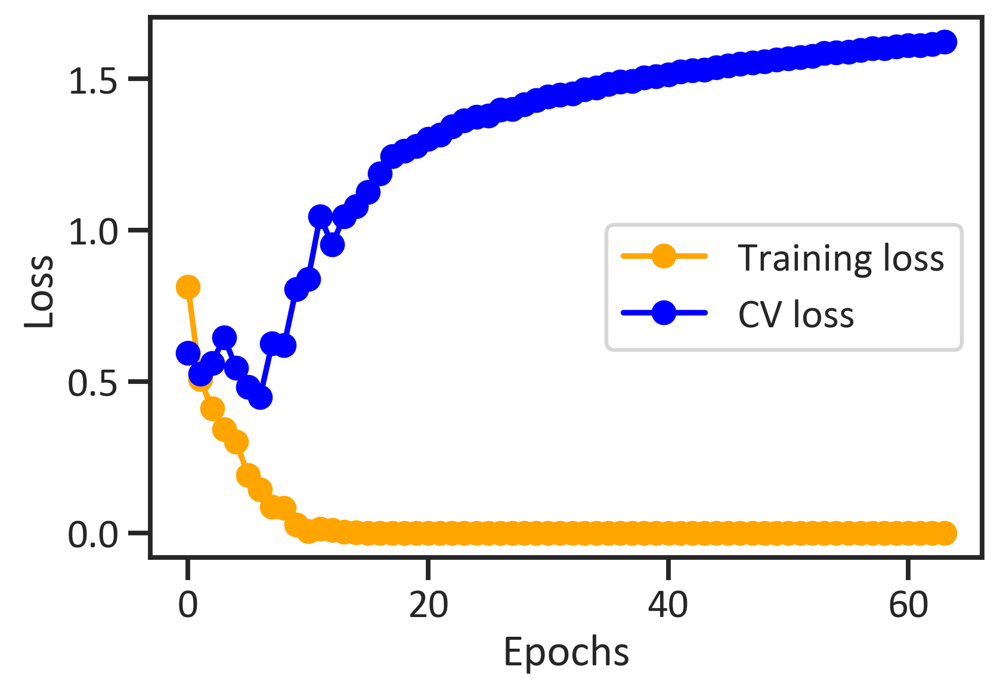

In [9]:
plt.plot(brain_tumor_convolutional_net_model_history.history["loss"],
         color = "orange",
         marker = "o",
         label = "Training loss")
plt.plot(brain_tumor_convolutional_net_model_history.history["val_loss"],
         color = "blue",
         marker = "o",
         label = "CV loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc = "best")
plt.show()

# Classifying Patients’ X-Ray Image Data by Executing a Convolutional Neural Network

In [23]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set("talk","ticks", font_scale = 1, font = "Calibri")
from pylab import rcParams
plt.rcParams["figure.dpi"] = 300

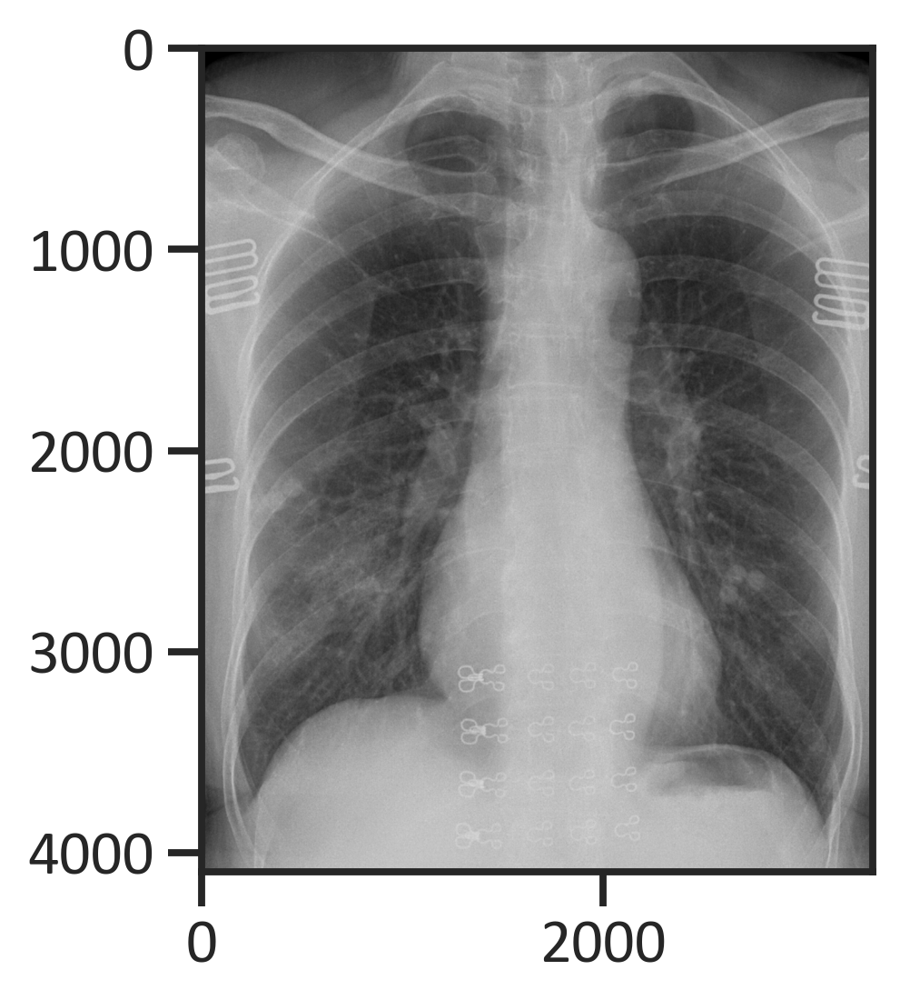

In [46]:
pneumonia_data = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\xray_dataset\train"
pneumonia_categories = ["PNEUMONIA"]
for x in pneumonia_categories:
    directory = os.path.join(pneumonia_data, x)
    for pneumonia_image in os.listdir(directory):
        pneumonia_images = cv2.imread(os.path.join(directory, pneumonia_image))   
plt.imshow(pneumonia_images)
plt.show()

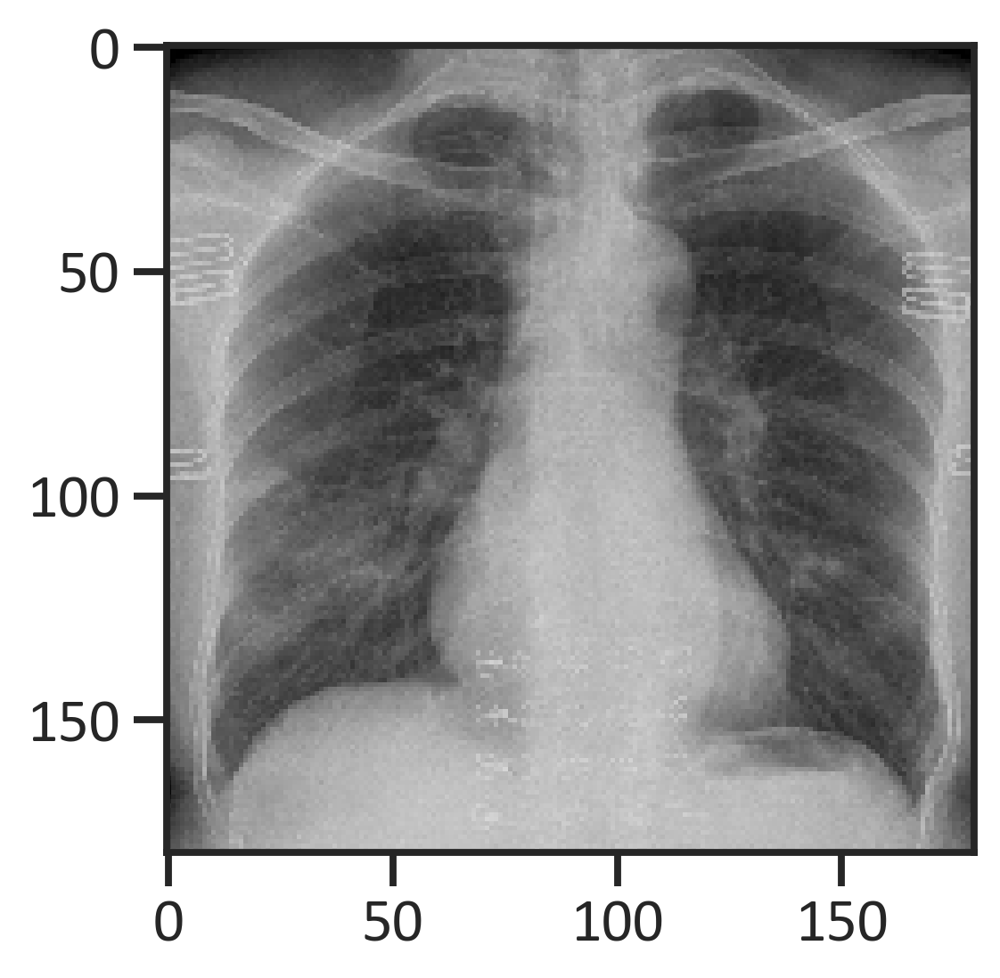

In [47]:
pneumonia_resized_image = cv2.resize(pneumonia_images, (180, 180))    
plt.imshow(pneumonia_resized_image)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


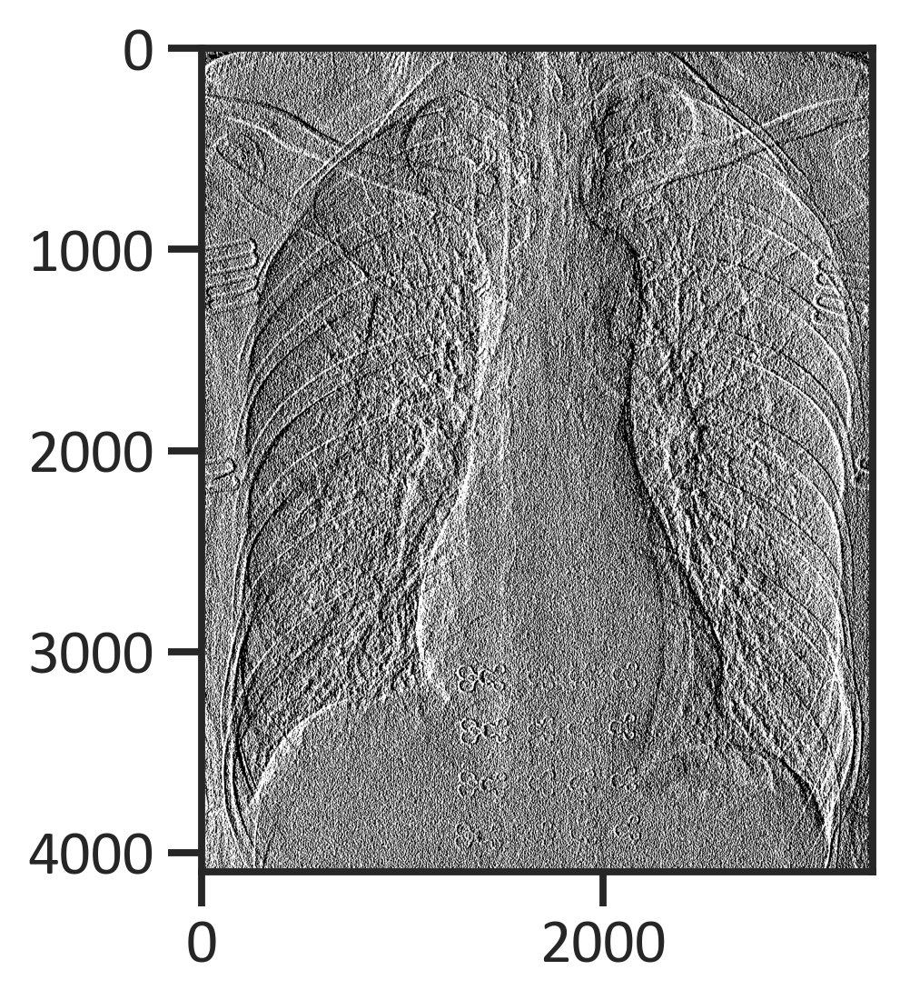

In [48]:
sobel_pneumonia_images = cv2.Sobel(pneumonia_images, cv2.CV_64F, 1, 0, ksize=5)
plt.imshow(sobel_pneumonia_images)
plt.show()

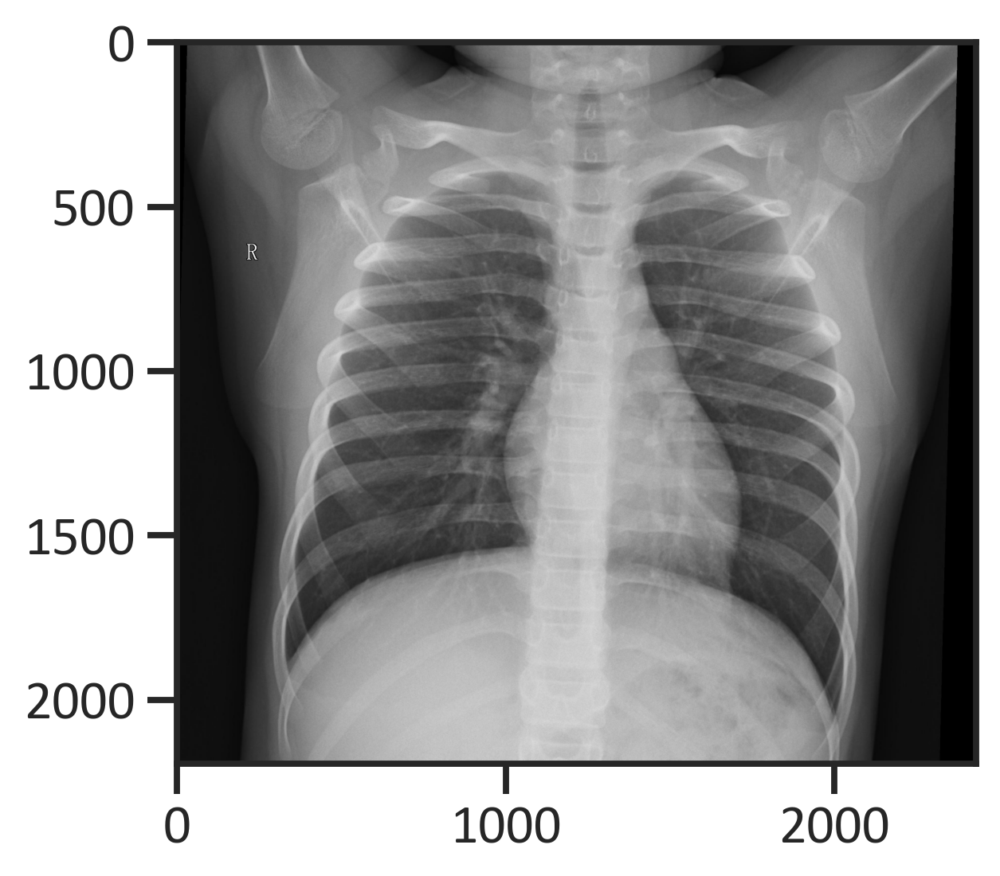

In [43]:
no_pneumonia_data = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\xray_dataset\train"
no_pneumonia_categories = ["NORMAL"]
for x in no_pneumonia_categories:
    directory = os.path.join(no_pneumonia_data, x)
    for no_pneumonia_image in os.listdir(directory):
        no_pneumonia_images = cv2.imread(os.path.join(directory, no_pneumonia_image))   
plt.imshow(no_pneumonia_images)
plt.show()

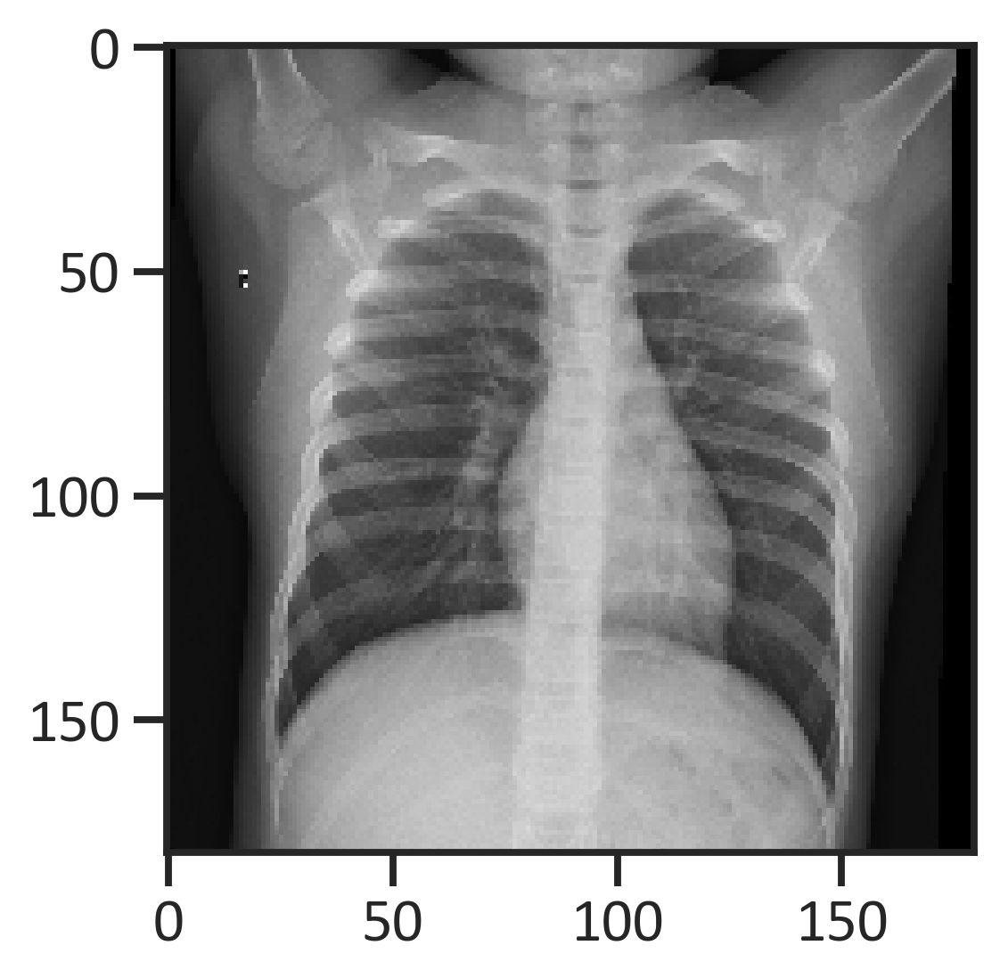

In [44]:
no_pneumonia_resized_image = cv2.resize(no_pneumonia_images, (180, 180))    
plt.imshow(no_pneumonia_resized_image)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


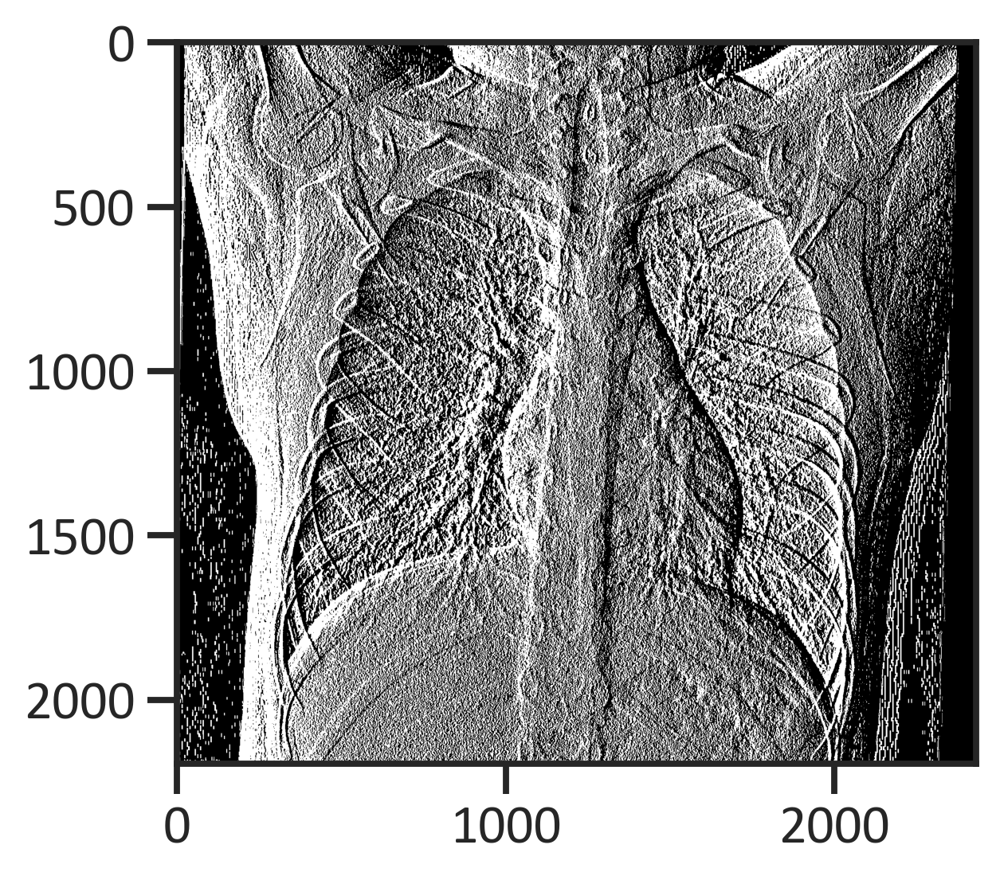

In [45]:
sobel_no_pneumonia_images = cv2.Sobel(no_pneumonia_images, cv2.CV_64F, 1, 0, ksize=5)
plt.imshow(sobel_no_pneumonia_images)
plt.show()

## Processing the Training Chest X-Ray Image Data

Found 148 files belonging to 2 classes.
Using 119 files for training.
Found 148 images belonging to 2 classes.


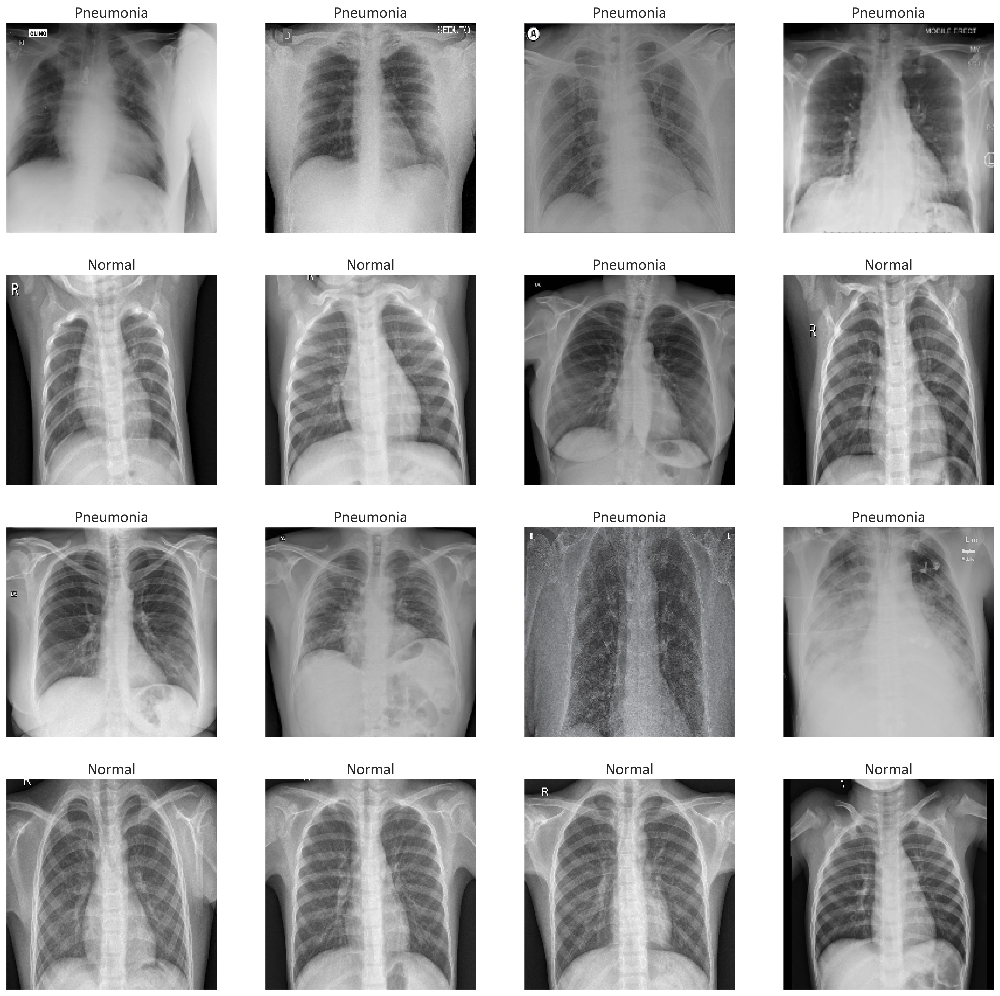

In [49]:
chest_x_ray_training_df = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\xray_dataset\train"
chest_x_ray_training_data = image_dataset_from_directory(chest_x_ray_training_df, seed = 123, validation_split = 0.2, subset = "training",  image_size = (180, 180), batch_size = 16)
chest_x_ray_training_data_categories = np.array(chest_x_ray_training_data.class_names)
chest_x_ray_generated_image_data = ImageDataGenerator(rescale = 1./255)
chest_x_ray_generated_image_data_for_training = chest_x_ray_generated_image_data.flow_from_directory(chest_x_ray_training_df, target_size = (180, 180), class_mode = "categorical",  shuffle = True,  batch_size = 16)
chest_x_ray_training_images, chest_x_ray_training_labels = next(iter(chest_x_ray_generated_image_data_for_training))
def chest_x_ray_images_training_function(chest_x_ray_training_images, chest_x_ray_training_labels):
    plt.figure(figsize = (20, 20))
    for n in range(16):
        ax = plt.subplot(4, 4, n+1)
        plt.imshow(chest_x_ray_training_images[n])
        plt.title(chest_x_ray_training_data_categories[chest_x_ray_training_labels[n]==1][0].title())
        plt.axis("off")
chest_x_ray_images_training_function(chest_x_ray_training_images, chest_x_ray_training_labels)

## Generating the Validation Chest X-Ray Image Data

Found 40 files belonging to 2 classes.
Using 8 files for validation.
Found 40 images belonging to 2 classes.


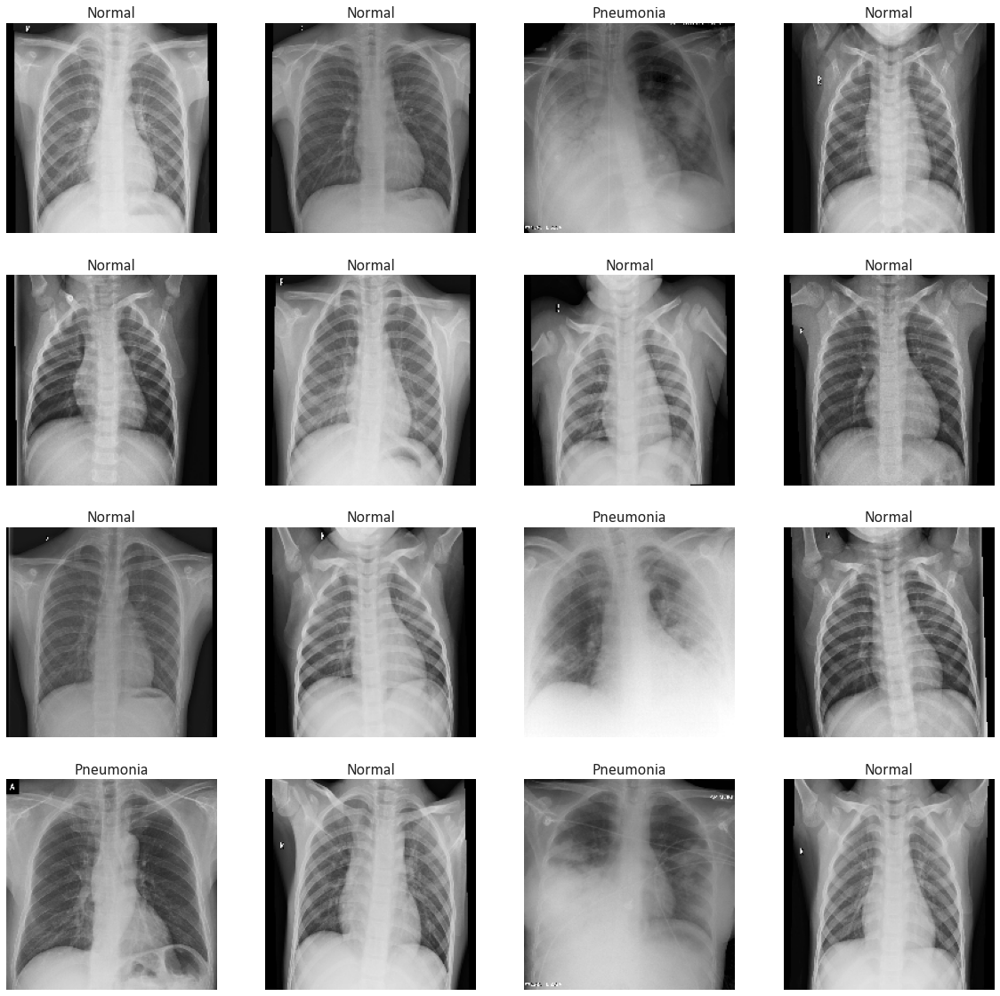

In [57]:
chest_x_ray_validation_df = r"C:\Users\i5 lenov\Desktop\Next_Chapter\source_code\xray_dataset\test"
chest_x_ray_validation_data = image_dataset_from_directory(chest_x_ray_validation_df, seed = 123, validation_split = 0.2, subset = "validation",  image_size = (180, 180), batch_size = 16)
chest_x_ray_validation_data_categories = np.array(chest_x_ray_validation_data.class_names)
chest_x_ray_generated_image_data = ImageDataGenerator(rescale = 1./255)
chest_x_ray_generated_image_data_for_validation = chest_x_ray_generated_image_data.flow_from_directory(chest_x_ray_validation_df, target_size = (180, 180), class_mode = "categorical", shuffle = True, batch_size = 16)
chest_x_ray_validation_images, chest_x_ray_validation_labels = next(iter(chest_x_ray_generated_image_data_for_validation))
def chest_x_ray_images_validation_function(chest_x_ray_validation_images, chest_x_ray_validation_labels):
    plt.figure(figsize = (20, 20))
    for n in range(16):
        ax = plt.subplot(4, 4, n+1)
        plt.imshow(chest_x_ray_validation_images[n])
        plt.title(chest_x_ray_validation_data_categories[chest_x_ray_validation_labels[n]==1][0].title())
        plt.axis("off")
chest_x_ray_images_validation_function(chest_x_ray_validation_images, chest_x_ray_validation_labels)

## Tuning the Training Chest X-Ray Image Data

In [12]:
chest_x_ray_experimental_tuning = tf.data.experimental.AUTOTUNE
chest_x_ray_training_data = chest_x_ray_training_data.cache().shuffle(1000).prefetch(buffer_size = chest_x_ray_experimental_tuning)
chest_x_ray_validation_data = chest_x_ray_validation_data.cache().prefetch(buffer_size = chest_x_ray_experimental_tuning)

## Executing the Convolutional Neural Network to Classify Patients’ Chest X-Ray Image Data

In [13]:
chest_x_ray_convolutional_net_model = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Conv2D(16, 3, activation = "relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, activation="relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(128, 3, activation="relu"),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(255, activation="relu"),
  tf.keras.layers.Dense(3)
])

In [14]:
chest_x_ray_convolutional_net_model.compile(optimizer = "adam", loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True), metrics = ["accuracy"])
chest_x_ray_convolutional_net_model_history = chest_x_ray_convolutional_net_model.fit(chest_x_ray_training_data, validation_data = chest_x_ray_validation_data, epochs = 64)

Epoch 1/64
8/8 [==============================] - 4s 520ms/step - loss: 0.9067 - accuracy: 0.5378 - val_loss: 0.6052 - val_accuracy: 0.5000
Epoch 2/64
8/8 [==============================] - 4s 508ms/step - loss: 0.4026 - accuracy: 0.8739 - val_loss: 0.0711 - val_accuracy: 1.0000
Epoch 3/64
8/8 [==============================] - 4s 523ms/step - loss: 0.1789 - accuracy: 0.9328 - val_loss: 0.0448 - val_accuracy: 1.0000
Epoch 4/64
8/8 [==============================] - 4s 486ms/step - loss: 0.1085 - accuracy: 0.9664 - val_loss: 0.0302 - val_accuracy: 1.0000
Epoch 5/64
8/8 [==============================] - 4s 473ms/step - loss: 0.0530 - accuracy: 0.9748 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 6/64
8/8 [==============================] - 4s 549ms/step - loss: 0.0272 - accuracy: 0.9832 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 7/64
8/8 [==============================] - 4s 513ms/step - loss: 0.0656 - accuracy: 0.9748 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 8/64
8/8 [====

Epoch 57/64
8/8 [==============================] - 4s 485ms/step - loss: 1.1576e-05 - accuracy: 1.0000 - val_loss: 4.2582e-05 - val_accuracy: 1.0000
Epoch 58/64
8/8 [==============================] - 5s 583ms/step - loss: 1.1086e-05 - accuracy: 1.0000 - val_loss: 4.1822e-05 - val_accuracy: 1.0000
Epoch 59/64
8/8 [==============================] - 6s 715ms/step - loss: 1.0657e-05 - accuracy: 1.0000 - val_loss: 4.0303e-05 - val_accuracy: 1.0000
Epoch 60/64
8/8 [==============================] - 5s 630ms/step - loss: 1.0189e-05 - accuracy: 1.0000 - val_loss: 3.9304e-05 - val_accuracy: 1.0000
Epoch 61/64
8/8 [==============================] - 5s 564ms/step - loss: 1.0019e-05 - accuracy: 1.0000 - val_loss: 3.8858e-05 - val_accuracy: 1.0000
Epoch 62/64
8/8 [==============================] - 5s 563ms/step - loss: 9.3458e-06 - accuracy: 1.0000 - val_loss: 3.7770e-05 - val_accuracy: 1.0000
Epoch 63/64
8/8 [==============================] - 4s 525ms/step - loss: 9.0774e-06 - accuracy: 1.0000 - v

## Considering the Convolutional Neural Network’s Performance

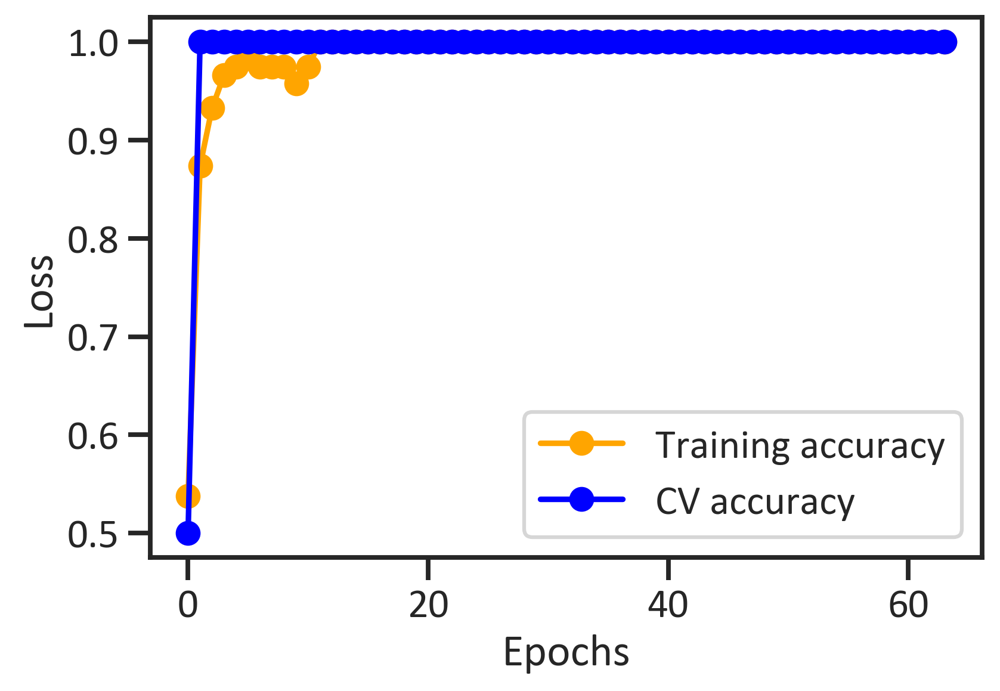

In [15]:
plt.plot(chest_x_ray_convolutional_net_model_history.history["accuracy"],
         color = "orange",
         marker = "o",
         label = "Training accuracy")
plt.plot(chest_x_ray_convolutional_net_model_history.history["val_accuracy"],
         color = "blue",
         marker = "o",
         label = "CV accuracy")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc = "best")
plt.show()

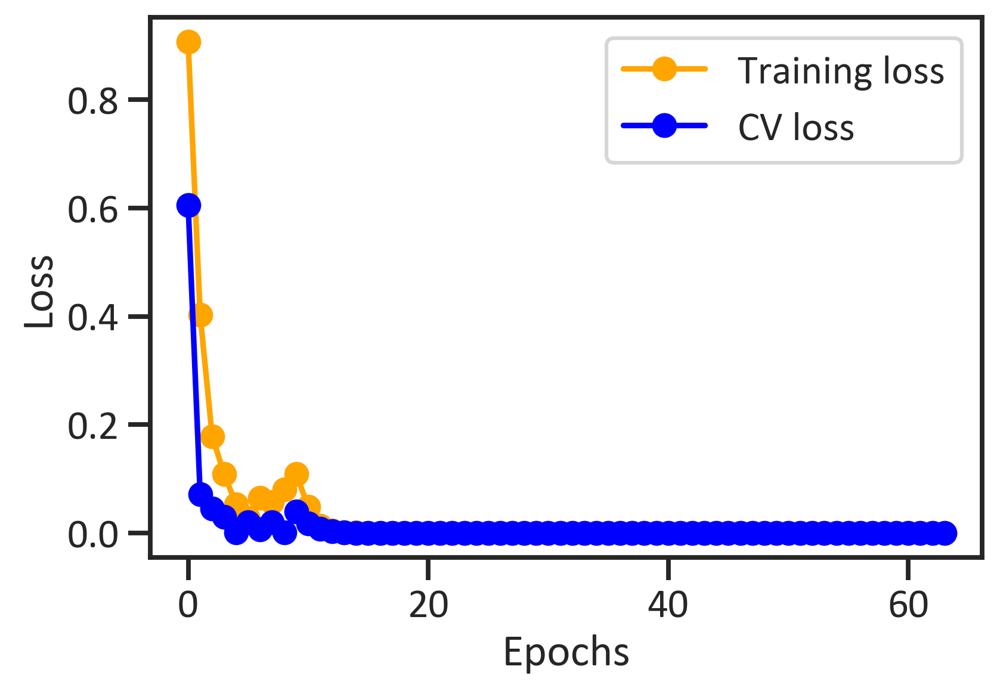

In [16]:
plt.plot(chest_x_ray_convolutional_net_model_history.history["loss"],
         color = "orange",
         marker = "o",
         label = "Training loss")
plt.plot(chest_x_ray_convolutional_net_model_history.history["val_loss"],
         color = "blue",
         marker = "o",
         label = "CV loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc = "best")
plt.show()